# Main Code Combined 

/home/baadror/anaconda2/envs/py35/lib/python3.5/site-packages/ipykernel_launcher.py:29: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).


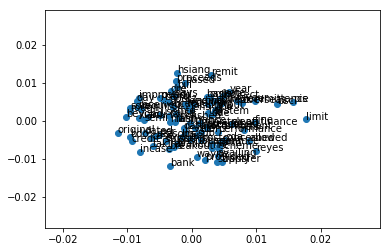

/home/baadror/anaconda2/envs/py35/lib/python3.5/site-packages/ipykernel_launcher.py:46: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).


In [2]:
import numpy as np
from gensim.models import Word2Vec
from sklearn.decomposition import PCA
from matplotlib import pyplot as plt

# f=open('input/0.txt','r')
# string=f.read()
# a=string
def sentence(a):
#     a='insurer insurance claim loss risk reinsurance life premium policyholder business year underwriting company policy liability capital written based line group actuary product also rate result exposure actuarial reserve annuity casualty catastrophe reinsurers naic property amount expected market development ratio used benefit change estimate paid experience surplus expense non include contract future assumption investment accident due excess pricing reinsurer earned event increase standard state one solvency including level model reported incurred generally value cover industry payment well factor captive ceded cost limit insurance_company method required insured general use gross statutory severity force individual period large provide regulator surrender charge analysis reserving'
    b=a.split(' ')
    c=[]
    d=[]
    for a in range(len(b)):
        i=0
        if a%5==0:
            c.append(d)
            d=[]
        d.append(b[a])
#     print(c)
    return c
    

def cluster_graph(a):
    sentences=sentence(a)
    # train model
    model = Word2Vec(sentences, min_count=1)
    # fit a 2d PCA model to the vectors
    X = model[model.wv.vocab]
    pca = PCA(n_components=2)
    result = pca.fit_transform(X)
    # create a scatter plot of the projection
    plt.scatter(result[:, 0], result[:, 1])
    words = list(model.wv.vocab)
    for i, word in enumerate(words):
        plt.annotate(word, xy=(result[i, 0], result[i, 1]))
    # pyplot.show()
    plt.figure(figsize=(60,40))
    plt.show()
#     print(words)
    model.save('model.bin')
    new_model = Word2Vec.load('model.bin')
#     print(new_model)
    X=[]
    for i in words:
        X.append(new_model[i])
    return new_model ,X,words

model ,X, words=cluster_graph(a)



In [10]:
X=np.array(X)
def match(X):
    score =[]
    for i in X:
        temp=[np.dot(i,j) for j in X]
        pos=np.argmax(temp, axis=0)
        temp[pos]=0
        score.append(temp)
        temp=[]
    match1=[]
    length=len(X)//3
    for i in score:
        temp1=[]
        for j in range(length):
            a=np.argmax(i , axis=0)
            temp1.append(a)
            i[a]=0
        match1.append(temp1)
    return  match1
ans =match(X)
f=open('ans.txt','w+')
# for i in range(3)
for  j in range(3):
    str1=[]
    for i in ans[j]:
        str1.append(words[i])
    str1=''.join(str1)
    f.write(str1)


# for i range(349):
#     f=open('ans.txt','w+')
def clustering(words,ans):
    for i in range(3):
        s1=[]
        s2=''
        for j in ans[i]:
            s2+=' '+words[j]
        s2+=s2+'.'
        s1.append(s2)
        
    return s1
            
def output(cluster, n):
    g='output1/{}.txt'.format(n)
    f=open(g,'w+')   
    f.write(str(cluster))
    


/home/baadror/anaconda2/envs/py35/lib/python3.5/site-packages/ipykernel_launcher.py:29: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).


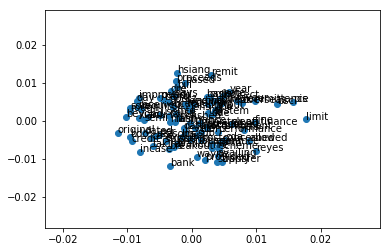

/home/baadror/anaconda2/envs/py35/lib/python3.5/site-packages/ipykernel_launcher.py:46: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).


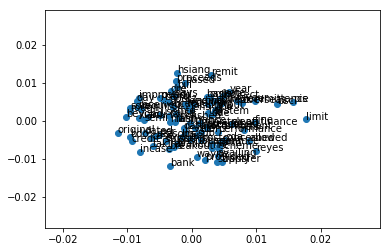

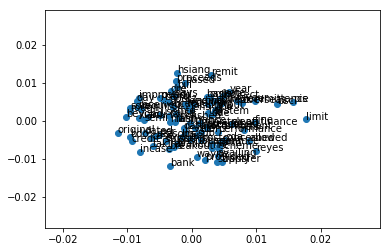

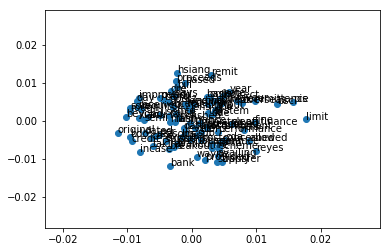

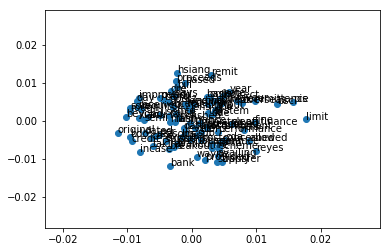

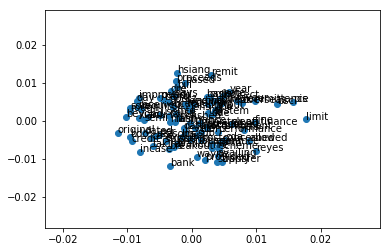

...

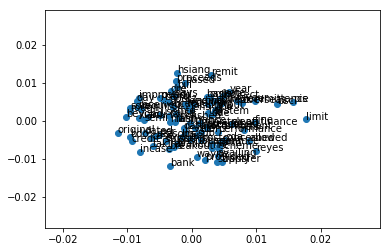

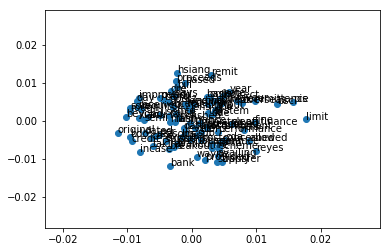

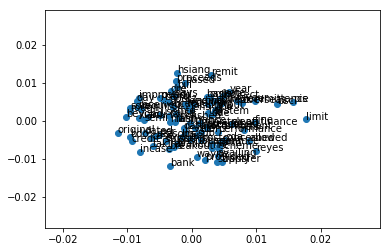

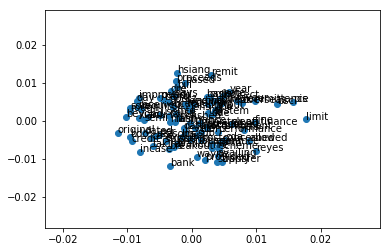

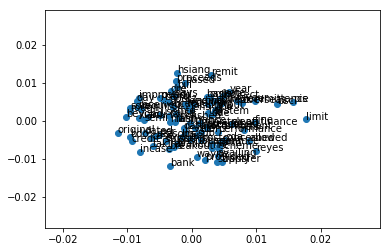

In [ ]:
if __name__=='__main__':
    for i in range(349):
        f=open('input/0.txt'.format(i),'r')
        string=f.read()
        a=string
        model , X, words =cluster_graph(a)
    #     print(words)
        ans=match(X)
        cluster=clustering(words,ans)
        output(cluster ,i)
#         print(cluster)

    
    
#     print(ans[0])
    
    